<a href="https://colab.research.google.com/github/vietcheems/Project-I/blob/main/Encoder-Decoder/Encoder_Decoder_SSA_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Install and import necessary depependencies

In [ ]:
! pip install transformers

     |████████████████████████████████| 3.4 MB 28.1 MB/s 
     |████████████████████████████████| 895 kB 52.3 MB/s 
     |████████████████████████████████| 67 kB 7.2 MB/s 
     |████████████████████████████████| 3.3 MB 55.8 MB/s 
     |████████████████████████████████| 596 kB 52.8 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
import random
import numpy as np
import pandas as pd
from torch.utils.tensorboard import SummaryWriter
import torch.optim as optim
from torch import nn
from tqdm.notebook import tqdm
from torch.autograd import Variable 
from sklearn.preprocessing import MinMaxScaler
import transformers
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed(42)
torch.cuda.manual_seed_all(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
os.environ['PYTHONHASHSEED'] = str(42)

import time as time

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score


import seaborn as sns
import matplotlib.pyplot as plt



In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


# Prepare our data for training

In [ ]:
train_df = pd.read_csv("/content/drive/MyDrive/chosen_data/train_df_ssa.csv", sep = ",")

dev_df = pd.read_csv("/content/drive/MyDrive/chosen_data/dev_df.csv", sep = ",")
test_df = pd.read_csv("/content/drive/MyDrive/chosen_data/test_df.csv", sep = ",")

train_df = train_df.drop(['wind_direct'], axis = 1)
dev_df = dev_df.drop(['wind_direct'], axis = 1)
test_df = test_df.drop(['wind_direct'], axis = 1)

In [ ]:
test_df

,pm,CH4,CO,Humid,Nitrogen_oxide,NO,NO2,non_methane_hydrocarbons,oxidant,SO2,solar_radiation,Suspended_particulate_matter,Temprature,total_hydrocacbon,wind_speed,wind_direct_1.0,wind_direct_2.0,wind_direct_3.0,wind_direct_4.0,wind_direct_5.0,wind_direct_6.0,wind_direct_7.0,wind_direct_8.0,wind_direct_9.0,wind_direct_10.0,wind_direct_11.0,wind_direct_12.0,wind_direct_13.0,wind_direct_14.0,wind_direct_15.0,wind_direct_16.0,wind_direct_17.0
0,0.177143,0.378049,0.15,0.846154,0.086957,0.0,0.117647,0.063492,0.500000,0.0625,0.159236,0.737838,0.268293,0.053892,7.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.232000,0.353659,0.10,0.897436,0.086957,0.0,0.117647,0.079365,0.406977,0.0625,0.203822,0.718919,0.260163,0.041916,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.232000,0.451220,0.10,0.935897,0.108696,0.0,0.147059,0.095238,0.267442,0.0625,0.261146,0.708108,0.333333,0.023952,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.273143,0.463415,0.10,0.935897,0.108696,0.0,0.147059,0.079365,0.232558,0.0625,0.191083,0.694595,0.333333,0.035928,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.245714,0.439024,0.10,0.961538,0.108696,0.0,0.147059,0.079365,0.232558,0.0625,0.235669,0.683784,0.317073,0.047904,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5255,0.081143,0.195122,0.15,0.948718,0.108696,0.0,0.147059,0.063492,0.406977,0.0625,0.159236,0.397297,0.146341,0.101796,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5256,0.067429,0.182927,0.10,0.961538,0.130435,0.0,0.176471,0.047619,0.372093,0.1250,0.082803,0.389189,0.130081,0.083832,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5257,0.163429,0.195122,0.10,0.935897,0.195652,0.0,0.264706,0.047619,0.302326,0.1250,0.070064,0.362162,0.138211,0.131737,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
5258,0.053714,0.219512,0.10,0.948718,0.130435,0.0,0.176471,0.063492,0.325581,0.1250,0.165605,0.359459,0.162602,0.155689,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


## Scaling our datasets

In [ ]:
scaler = MinMaxScaler(feature_range = (0,1))
def data_scaler(df):
  station = df.copy()
  scaled = scaler.fit_transform(station[station.columns[:14]])
  scaled = pd.DataFrame(scaled, columns=station.columns[:14],index = station.index)
  for feature in scaled.columns:
    station[feature] = scaled[feature]
  return station

In [ ]:
train_df= data_scaler(train_df)
dev_df = data_scaler(dev_df)
test_df = data_scaler(test_df)

In [ ]:
train_df

,pm,CH4,CO,Humid,Nitrogen_oxide,NO,NO2,non_methane_hydrocarbons,oxidant,SO2,solar_radiation,Suspended_particulate_matter,Temprature,total_hydrocacbon,wind_speed,wind_direct_1.0,wind_direct_2.0,wind_direct_3.0,wind_direct_4.0,wind_direct_5.0,wind_direct_6.0,wind_direct_7.0,wind_direct_8.0,wind_direct_9.0,wind_direct_10.0,wind_direct_11.0,wind_direct_12.0,wind_direct_13.0,wind_direct_14.0,wind_direct_15.0,wind_direct_16.0,wind_direct_17.0
0,0.122934,0.233645,0.176471,0.8875,0.122807,0.000000,0.162791,0.112245,0.108108,0.000000,0.093137,0.351090,0.244755,0.049296,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.142559,0.242991,0.117647,0.8875,0.087719,0.000000,0.116279,0.112245,0.099099,0.043478,0.102941,0.351090,0.251748,0.035211,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.157490,0.271028,0.117647,0.9000,0.087719,0.000000,0.116279,0.122449,0.153153,0.043478,0.117647,0.348668,0.279720,0.056338,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.159084,0.355140,0.117647,0.9500,0.122807,0.000000,0.162791,0.142857,0.162162,0.043478,0.132353,0.387409,0.356643,0.105634,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.158103,0.355140,0.117647,0.9375,0.122807,0.000000,0.162791,0.153061,0.207207,0.043478,0.166667,0.372881,0.363636,0.091549,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24539,0.140136,0.196262,0.000000,0.1500,0.070175,0.032258,0.069767,0.030612,0.324324,0.043478,0.049020,0.334140,0.160839,0.422535,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
24540,0.102260,0.196262,0.058824,0.0875,0.070175,0.032258,0.069767,0.030612,0.324324,0.000000,0.014706,0.348668,0.160839,0.485915,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
24541,0.086828,0.196262,0.058824,0.0625,0.035088,0.000000,0.046512,0.020408,0.333333,0.000000,0.053922,0.351090,0.153846,0.528169,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
24542,0.113024,0.196262,0.058824,0.0500,0.035088,0.000000,0.046512,0.020408,0.333333,0.000000,0.073529,0.351090,0.153846,0.535211,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


## Create a dataset class
 - X: All the features from time step t-input_length to t-1
 - Y: The PM 2.5 indices from time step t to t+output_length

In [ ]:
class pmDataset(Dataset):
  def __init__(self, df, target, features, input_length, output_length):
    self.features = features
    self.target = target
    self.input_length = input_length
    self.output_length = output_length
    self.y = torch.tensor(df[target].values).float()
    self.X = torch.tensor(df[features].values).float()
    self.max_len = len(df[features])

  def __len__(self):
    return self.X.shape[0] 

  def __getitem__(self, i): 
    if i >= self.input_length:
        i_start = i - self.input_length
        x = self.X[i_start:i , :]
    else:
        padding = self.X[0].repeat(self.input_length - i, 1)
        x = self.X[0:i, :]
        x = torch.cat((padding, x), 0)

    targets = torch.zeros(self.output_length,1)

    if i > (self.max_len  - self.output_length):
      for j in range((self.max_len - i) ):
        targets[j] = self.y[i+j]
      
      for j in range(self.max_len - i,self.output_length):
        targets[j] = targets[(self.max_len - i - 1) ]
    
    else:
      targets = self.y[i: i + self.output_length]
    return x, targets

  def get_dataset(self):
    x_tensor = []
    y_tensor = []

    for i in range(self.max_len):
      x,y = self[i]
      x_tensor.append(x)
      y_tensor.append(y)
    
    x_tensor = torch.stack(x_tensor,0)
    y_tensor = torch.stack(y_tensor,0) 
    return x_tensor, y_tensor

## Create a dataloader

In [ ]:
def get_loader(df, input_length, output_length,batch_size = 64,shuffle = True):  
  features = df.columns[1:].tolist()
  features.append('pm')
  target = ['pm']

  dataset = pmDataset(df,target = target, features = features, input_length = input_length, output_length = output_length)
  loader = DataLoader(
      dataset=dataset,
      batch_size=batch_size,
      shuffle=shuffle,
  )
  return loader, dataset

# Define our main encoder-decoder model

## The additive attention

In [ ]:
class Attention(nn.Module):
  def __init__(self, key_size, query_size, num_hiddens, dropout, **kwargs):
    super(Attention, self).__init__(**kwargs)
    self.W_k = nn.Linear(key_size, num_hiddens, bias=False)
    self.W_q = nn.Linear(query_size, num_hiddens, bias=False)
    self.w_v = nn.Linear(num_hiddens, 1, bias=False)
    self.dropout = nn.Dropout(dropout)

  def forward(self, queries, keys, values):
    queries, keys = self.W_q(queries), self.W_k(keys)
    # After dimension expansion, shape of `queries`: (`batch_size`, no. of
    # queries, 1, `num_hiddens`) and shape of `keys`: (`batch_size`, 1,
    # no. of key-value pairs, `num_hiddens`). Sum them up with
    # broadcasting
    features = queries.unsqueeze(2) + keys.unsqueeze(1)
    features = torch.tanh(features)
    # There is only one output of `self.w_v`, so we remove the last
    # one-dimensional entry from the shape. Shape of `scores`:
    # (`batch_size`, no. of queries, no. of key-value pairs)
    scores = self.w_v(features).squeeze(-1)
    self.attention_weights = nn.functional.softmax(scores, dim=-1)
    # Shape of `values`: (`batch_size`, no. of key-value pairs, value
    # dimension)
    return torch.bmm(self.dropout(self.attention_weights), values)

## The Encoder

In [ ]:

class Encoder(nn.Module):
  def __init__(self, encoder_input_size, hidden_size, num_layers ,device, drop_out ):
      super().__init__()
      self.input_size = encoder_input_size
      self.hidden_size = hidden_size
      self.num_layers = num_layers
      self.device = device
      self.lstm = nn.LSTM(input_size = encoder_input_size, hidden_size = hidden_size, num_layers =  self.num_layers, batch_first = True, dropout = drop_out)
      self.init_weights()
            
  def forward(self, x):
    # x: (batch_size,sequence_length, input_size)
    x = x.to(self.device)
    # h_0, c_0 (num_layers, batch_size, hidden_size)
    h_0 = torch.zeros(self.num_layers, x.shape[0], self.hidden_size).to(self.device) #hidden state
    c_0 = torch.zeros(self.num_layers, x.shape[0], self.hidden_size).to(self.device) #internal state

    # output: (batch_size, sequence_length, hidden_size)
    # h_n: (num_layers, batch_size, hidden_size)
    output, (hidden, cell) = self.lstm(x, (h_0, c_0)) #lstm with input, hidden, and internal state
    
    return output, (hidden, cell)
  
  def init_weights(self):
    for m in self.modules():
      if type(m) in [nn.GRU, nn.LSTM, nn.RNN]:
        for name, param in m.named_parameters():
          if 'weight_ih' in name:
            torch.nn.init.xavier_uniform_(param.data)
          elif 'weight_hh' in name:
              torch.nn.init.orthogonal_(param.data)
          elif 'bias' in name:
              param.data.fill_(0)
      elif isinstance(m, nn.Linear):
        nn.init.xavier_uniform_(m.weight)



## The Decoder

In [ ]:
class Decoder(nn.Module):
  def __init__(self, hidden_size, num_layers, device,
                dropout=0, output_size = 1):
    super(Decoder, self).__init__()
    self.hidden_size = hidden_size
    self.num_layers = num_layers
    self.device = device
    self.dropout = dropout
    self.output_size = output_size
    self.lstm = nn.LSTM(self.hidden_size, self.hidden_size, self.num_layers,
        dropout= self.dropout, batch_first = True)
    self.fc = nn.Linear(hidden_size, output_size)
    self.relu = nn.ReLU()   
    self.init_weights() 

  def forward(self, x, hidden, cell):

    # Feed the decoder input, and the last hidden state and cell state through an lstm layer
    input = x.to(device)
    out, (hidden, cell) = self.lstm(input, (hidden, cell))

    # RELU and linear layer for output
    out = self.relu(out)
    out = self.fc(out)

    return out, hidden, cell


  def init_weights(self):
    for m in self.modules():
      if type(m) in [nn.GRU, nn.LSTM, nn.RNN]:
        for name, param in m.named_parameters():
          if 'weight_ih' in name:
            torch.nn.init.xavier_uniform_(param.data)
          elif 'weight_hh' in name:
              torch.nn.init.orthogonal_(param.data)
          elif 'bias' in name:
              param.data.fill_(0)
      elif isinstance(m, nn.Linear):
        nn.init.xavier_uniform_(m.weight)



## Encoder - Decoder

In [ ]:
class EncoderDecoder(nn.Module):
  def __init__(self,device,encoder_input_size = len(train_df.columns), input_length = 48, output_length = 12, output_size = 1, hidden_size = 32, num_layers = 1, dropout = 0):
    super(EncoderDecoder, self).__init__()
    self.encoder_input_size = encoder_input_size
    self.device = device
    self.output_size = output_size
    self.hidden_size = hidden_size
    self.num_layers = num_layers
    self.input_length = input_length
    self.output_length = output_length
    self.encoder = Encoder(self.encoder_input_size, self.hidden_size, self.num_layers, self.device, dropout)
    self.decoder = Decoder(self.hidden_size, self.num_layers, self.device, dropout)
    self.attention = Attention(hidden_size, hidden_size, hidden_size, dropout)

    self.fc = nn.Linear(hidden_size, output_size)
    self.relu = nn.ReLU()

  def forward(self, x, target = None, teacher_force_ratio = 0):

    # Feed the input through the encoder, retrieve the encoded vector and hidden states, cell states
    encoded_vector, (enc_hidden, enc_cell)= self.encoder(x)
    hidden, cell = enc_hidden, enc_cell
    encoded_vector = encoded_vector.to(device)

    #The first input to the decoder will be the pm2.5 of time step i-1, if we were to predict from time step i
    decoder_input = x[:,:,-1:]
    decoder_input = decoder_input[:, -1: ,-1:]


    #Iterate
    outputs = []
    for step in range(self.output_length):
      #decoder_input =  transform_decoder_input(decoder_input, encoded_vector.shape[1], encoded_vector.shape[2])
      decoder_input = decoder_input.to(device)
      #decoder_input = decoder_input + encoded_vector
      #decoder_input = torch.cat((decoder_input, encoded_vector), dim = 1)
      
      if hidden.shape[0] == 1:
        query = hidden.permute((1,0,2))
      else:
        h = torch.unsqueeze(hidden[-1], dim = 0)
        query = h.permute((1,0,2))
    
      context = self.attention(query, encoded_vector, encoded_vector)

      # print(context.shape, decoder_input.shape)
      #decoder_input = context + decoder_input
      decoder_input = torch.cat((context[:,:,:-1], decoder_input), dim = 2)

      decoder_output, hidden, cell = self.decoder(decoder_input,hidden, cell)
    
      teacher_force = random.random() < teacher_force_ratio
      if teacher_force:
        decoder_input = target[:,step+1:step+2,:]
      else:
        decoder_input = decoder_output

      outputs.append(decoder_output)
    
    outputs = torch.cat(outputs,1)
  
    return outputs
  

## Functions to save or load our models

In [ ]:
def save_checkpoint(state, file_name):
  torch.save(state, file_name)

def load_checkpoint(checkpoint_path, model):
  checkpoint = torch.load(checkpoint_path)
  model.load_state_dict(checkpoint["state_dict"], strict = False)

# Training the models

## Function for training the model on the training set

In [ ]:
def training_step(model, optimizer,scheduler,src, tgt, criterion):
  model.train()
  inp_data = src.to(device)
  target = tgt.to(device)
  # forward prop
  output = model(inp_data, target = target, teacher_force_ratio = 0.5)
  optimizer.zero_grad()
  loss = criterion(output, target)
  loss.backward()
  torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
  optimizer.step()
  scheduler.step()

  return loss.item()

## Function to evaluate the model on the dev set during training

In [ ]:

def validate(model, dev_dataset):
  model.eval()
  with torch.no_grad():
    src, tgt = dev_dataset.get_dataset()
    inp_data = src.to(device)
    target = tgt.to(device)
    output = model(inp_data)
    eval_loss = criterion(output, target)
  return eval_loss.item()


## Declare some constant hyperparameters

In [ ]:
num_epochs = 10
batch_size = 64
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


load_model = False
save_model = True
shuffle = True


encoder_input_size = len(train_df.columns)
decoder_input_size = 1
output_size = 1
hidden_size = 20
drop_out = 0.10

criterion = nn.MSELoss()

## Training our models with different configurations

In [ ]:
  print('Training model with, input_length = {0}, output_length = {1}, learning rate = {2}, num_layers = {3} '.format(input_length, output_length, learning_rate, num_layers))  
  start = time.time()

  # Declare our training and dev sets for different input and output window length
  train_loader, train_dataset = get_loader(train_df, batch_size = batch_size, shuffle = True, input_length = input_length, output_length = output_length)
  dev_loader, dev_dataset = get_loader(dev_df, batch_size = batch_size, shuffle = True, input_length = input_length, output_length = output_length)

  #Declare our main model
  model = EncoderDecoder(device = device,encoder_input_size = encoder_input_size, output_length = output_length,
                         output_size = output_size, hidden_size = hidden_size, num_layers = num_layers, dropout = drop_out).to(device)

  #Declare the optimizer and scheduler
  optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
  scheduler = transformers.get_cosine_schedule_with_warmup(optimizer, num_warmup_steps = int(num_epochs * len(train_loader) * 0.3), 
                                                         num_training_steps = num_epochs * len(train_loader) )

  #Keeping tracks of the number of training steps and the best validation loss
  step = 0
  best_val_loss = 999

  #Tensorboard visualization
  loss_plot_name = 'runs/input={0}_output={1}_lr={2}_num_layers={3}'.format(input_length, output_length, learning_rate, num_layers)
  writer = SummaryWriter(loss_plot_name)

  train_loss = []
  val_loss  = []

  #Keep track of the latest step that has the best validation score. After 2.5 epochs without improvement, perform early stopping and stop training
  last_updated_step = 0
  stop = False
  
  #Iterate through 10 epochs
  for epoch in range(num_epochs):

    #Early stopping
    if stop == True:
      break
    print("***************************    Epoch number {}    ***************************".format(epoch + 1))
    model.train()
    losses = []
    for batch_idx, (src, tgt) in enumerate(tqdm(train_loader, position=0, leave=True)):
      step += 1
      #Early stopping
      if stop == True:
        print('Early stopping enabled!')
        break
      if step - last_updated_step >= (len(train_loader) * 2.5):
        stop = True
      
      #Perform a training step
      loss = training_step(model,optimizer,scheduler,src,tgt,criterion)
      losses.append(loss)

      #Calculate validation loss every 50 steps
      if step == 1 or step % 50 == 0:
        eval_loss = validate(model, dev_dataset)
        train_loss.append(sum(losses) / len(losses))
        val_loss.append(eval_loss)

        # print("Current step: {0}, epoch: {1}".format(step,epoch + 1), end = "    ")
        # print("Training loss: ", sum(losses) / len(losses), end = "    ")
        # print("Evaluation loss: ", eval_loss, end = "    " )

        writer.add_scalar("Evaluation loss with output length = {0}".format(output_length), eval_loss, step)

        checkpoint = {
            "state_dict" : model.state_dict(),
            "optimizer" : optimizer.state_dict(),
            "scheduler" : scheduler.state_dict()
        }
        #Save our model if the model achieve best validation loss
        if eval_loss < best_val_loss:
          best_val_loss = eval_loss
          save_checkpoint(checkpoint, "/content/drive/MyDrive/Encoder-Decoder-SSA/encoder_input_window={0}_output_window={1}_model_lr={2}_num_layers={3}.pth.tar".format(input_length, output_length, learning_rate, num_layers))  # Lưu lại model
          last_updated_step = step
          #print("(Best weights updated!)")
        else:
          pass
          #print()
  print('The best loss on the dev set with the configuration : input_length = {0}, output_length = {1}, learning rate = {2}, num_layers = {3} is: {4}, with the time = {5}'
  .format(input_length, output_length, learning_rate, num_layers,best_val_loss, time.time() - start ) )
  print()
  return best_val_loss 



In [ ]:
input_lengths = [24,48,72]
output_lengths = [6,9,12]
lrs = [1e-2,1e-3]
num_layers_list = [1,2]

for input_length in input_lengths:
  for output_length in output_lengths:
    for learning_rate in lrs:
      for num_layers in num_layers_list:
        training_phase(input_length = input_length, output_length = output_length, learning_rate= learning_rate, num_layers = num_layers)

Training model with, input_length = 24, output_length = 6, learning rate = 0.01, num_layers = 1 
***************************    Epoch number 1    ***************************


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 9    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 10    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 24, output_length = 6, learning rate = 0.01, num_layers = 1 is: 0.0038305092602968216, with the time = 68.17046046257019

Training model with, input_length = 24, output_length = 6, learning rate = 0.01, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 24, output_length = 6, learning rate = 0.01, num_layers = 2 is: 0.003960651811212301, with the time = 55.41215968132019

Training model with, input_length = 24, output_length = 6, learning rate = 0.001, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 24, output_length = 6, learning rate = 0.001, num_layers = 1 is: 0.004120759665966034, with the time = 45.59696936607361

Training model with, input_length = 24, output_length = 6, learning rate = 0.001, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 24, output_length = 6, learning rate = 0.001, num_layers = 2 is: 0.003974405582994223, with the time = 63.87933278083801

Training model with, input_length = 24, output_length = 9, learning rate = 0.01, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 9    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 10    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

The best loss on the dev set with the configuration : input_length = 24, output_length = 9, learning rate = 0.01, num_layers = 1 is: 0.0042512803338468075, with the time = 96.6166660785675

Training model with, input_length = 24, output_length = 9, learning rate = 0.01, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 24, output_length = 9, learning rate = 0.01, num_layers = 2 is: 0.004357505589723587, with the time = 59.78292632102966

Training model with, input_length = 24, output_length = 9, learning rate = 0.001, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 9    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 24, output_length = 9, learning rate = 0.001, num_layers = 1 is: 0.004373920150101185, with the time = 87.94170022010803

Training model with, input_length = 24, output_length = 9, learning rate = 0.001, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 24, output_length = 9, learning rate = 0.001, num_layers = 2 is: 0.004253218416124582, with the time = 93.58329176902771

Training model with, input_length = 24, output_length = 12, learning rate = 0.01, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 24, output_length = 12, learning rate = 0.01, num_layers = 1 is: 0.004670439288020134, with the time = 48.912317752838135

Training model with, input_length = 24, output_length = 12, learning rate = 0.01, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 24, output_length = 12, learning rate = 0.01, num_layers = 2 is: 0.0045484509319067, with the time = 52.75201940536499

Training model with, input_length = 24, output_length = 12, learning rate = 0.001, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 9    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 10    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

The best loss on the dev set with the configuration : input_length = 24, output_length = 12, learning rate = 0.001, num_layers = 1 is: 0.004703172016888857, with the time = 120.19672799110413

Training model with, input_length = 24, output_length = 12, learning rate = 0.001, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 9    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 24, output_length = 12, learning rate = 0.001, num_layers = 2 is: 0.004471341148018837, with the time = 122.59452891349792

Training model with, input_length = 48, output_length = 6, learning rate = 0.01, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 48, output_length = 6, learning rate = 0.01, num_layers = 1 is: 0.004012771882116795, with the time = 28.587536334991455

Training model with, input_length = 48, output_length = 6, learning rate = 0.01, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 48, output_length = 6, learning rate = 0.01, num_layers = 2 is: 0.004022992681711912, with the time = 36.78584551811218

Training model with, input_length = 48, output_length = 6, learning rate = 0.001, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 9    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 10    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

The best loss on the dev set with the configuration : input_length = 48, output_length = 6, learning rate = 0.001, num_layers = 1 is: 0.004185544792562723, with the time = 82.99723196029663

Training model with, input_length = 48, output_length = 6, learning rate = 0.001, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 48, output_length = 6, learning rate = 0.001, num_layers = 2 is: 0.00386949279345572, with the time = 56.814191818237305

Training model with, input_length = 48, output_length = 9, learning rate = 0.01, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 48, output_length = 9, learning rate = 0.01, num_layers = 1 is: 0.004525200463831425, with the time = 37.872119665145874

Training model with, input_length = 48, output_length = 9, learning rate = 0.01, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 48, output_length = 9, learning rate = 0.01, num_layers = 2 is: 0.004419730976223946, with the time = 49.02641415596008

Training model with, input_length = 48, output_length = 9, learning rate = 0.001, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 48, output_length = 9, learning rate = 0.001, num_layers = 1 is: 0.00449358019977808, with the time = 67.56640625

Training model with, input_length = 48, output_length = 9, learning rate = 0.001, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 48, output_length = 9, learning rate = 0.001, num_layers = 2 is: 0.004421363119035959, with the time = 62.15543055534363

Training model with, input_length = 48, output_length = 12, learning rate = 0.01, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 9    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 10    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

The best loss on the dev set with the configuration : input_length = 48, output_length = 12, learning rate = 0.01, num_layers = 1 is: 0.004681689664721489, with the time = 125.37049913406372

Training model with, input_length = 48, output_length = 12, learning rate = 0.01, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 48, output_length = 12, learning rate = 0.01, num_layers = 2 is: 0.004760828334838152, with the time = 70.45330834388733

Training model with, input_length = 48, output_length = 12, learning rate = 0.001, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 48, output_length = 12, learning rate = 0.001, num_layers = 1 is: 0.004893611650913954, with the time = 68.89764094352722

Training model with, input_length = 48, output_length = 12, learning rate = 0.001, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 48, output_length = 12, learning rate = 0.001, num_layers = 2 is: 0.004549868404865265, with the time = 76.9103786945343

Training model with, input_length = 72, output_length = 6, learning rate = 0.01, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 72, output_length = 6, learning rate = 0.01, num_layers = 1 is: 0.004197016358375549, with the time = 38.351739168167114

Training model with, input_length = 72, output_length = 6, learning rate = 0.01, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 72, output_length = 6, learning rate = 0.01, num_layers = 2 is: 0.004063020925968885, with the time = 73.38878631591797

Training model with, input_length = 72, output_length = 6, learning rate = 0.001, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 72, output_length = 6, learning rate = 0.001, num_layers = 1 is: 0.004158633295446634, with the time = 49.302289962768555

Training model with, input_length = 72, output_length = 6, learning rate = 0.001, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 9    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 72, output_length = 6, learning rate = 0.001, num_layers = 2 is: 0.003911318723112345, with the time = 95.39462208747864

Training model with, input_length = 72, output_length = 9, learning rate = 0.01, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 9    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 10    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

The best loss on the dev set with the configuration : input_length = 72, output_length = 9, learning rate = 0.01, num_layers = 1 is: 0.004251984879374504, with the time = 111.63841319084167

Training model with, input_length = 72, output_length = 9, learning rate = 0.01, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 72, output_length = 9, learning rate = 0.01, num_layers = 2 is: 0.0043163057416677475, with the time = 103.5617127418518

Training model with, input_length = 72, output_length = 9, learning rate = 0.001, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 72, output_length = 9, learning rate = 0.001, num_layers = 1 is: 0.004433953203260899, with the time = 72.47514247894287

Training model with, input_length = 72, output_length = 9, learning rate = 0.001, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 9    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 10    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

The best loss on the dev set with the configuration : input_length = 72, output_length = 9, learning rate = 0.001, num_layers = 2 is: 0.004253174178302288, with the time = 137.51450562477112

Training model with, input_length = 72, output_length = 12, learning rate = 0.01, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 72, output_length = 12, learning rate = 0.01, num_layers = 1 is: 0.004845623392611742, with the time = 48.21413516998291

Training model with, input_length = 72, output_length = 12, learning rate = 0.01, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 72, output_length = 12, learning rate = 0.01, num_layers = 2 is: 0.004776897374540567, with the time = 72.54093813896179

Training model with, input_length = 72, output_length = 12, learning rate = 0.001, num_layers = 1 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 72, output_length = 12, learning rate = 0.001, num_layers = 1 is: 0.0048700300976634026, with the time = 73.01031637191772

Training model with, input_length = 72, output_length = 12, learning rate = 0.001, num_layers = 2 
***************************    Epoch number 1    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 2    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 3    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 4    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 5    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 6    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 7    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

***************************    Epoch number 8    ***************************


  0%|          | 0/384 [00:00<?, ?it/s]

Early stopping enabled!
The best loss on the dev set with the configuration : input_length = 72, output_length = 12, learning rate = 0.001, num_layers = 2 is: 0.0044995201751589775, with the time = 126.67566204071045



## Visualize the training process

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

# Testing our trained models

Function to unscale our tensors to the original values

In [ ]:
def unscale_tensor(tensor):
  unscaled_tensor =  np.zeros(shape = tensor.shape)
  for i in range(tensor.shape[0]):
      sequence = tensor[i]
      sequence = sequence.cpu().detach().numpy()
      sequence =  np.reshape(sequence, (sequence.shape[0],1))
      padded_sequence = np.zeros(shape = (sequence.shape[0],14) )
      padded_sequence[:,0] = sequence[:,0]
      sequence = scaler.inverse_transform(padded_sequence)[:,0]
      unscaled_tensor[i] = sequence

  return unscaled_tensor

## Function to evaluate the models' losses on the test set

In [ ]:
def test_model(input_length, output_length, learning_rate, num_layers , print_loss = False):
  model = EncoderDecoder(device = device,encoder_input_size = encoder_input_size, output_length = output_length,
                         output_size = output_size, hidden_size = hidden_size, num_layers = num_layers, dropout = drop_out).to(device)
  
  test_loader, test_dataset = get_loader(test_df, batch_size = batch_size, shuffle = False, input_length = input_length, output_length = output_length)

  load_checkpoint("/content/drive/MyDrive/Encoder-Decoder-SSA/encoder_input_window={0}_output_window={1}_model_lr={2}_num_layers={3}.pth.tar".format(input_length, output_length, learning_rate, num_layers) ,model = model)
  model.eval()

  with torch.no_grad():
    test_input, test_target = test_dataset.get_dataset()
    test_input = test_input.to(device)
    test_target = test_target.to(device)
    output = model(test_input)
    output, test_target = output.squeeze(), test_target.squeeze()
    output, test_target = unscale_tensor(output), unscale_tensor(test_target)

  if print_loss == True:
    mae = mean_absolute_error(output, test_target)
    mse = mean_squared_error(test_target, output)
    r2 = r2_score(test_target, output)
    
    print("The test losses at output_length = {0}, input_length = {1}, learning_rate = {2}, num_layer = {3}".format( output_length, input_length, learning_rate, num_layers))
    print('MSE loss : ', mse, end = " ")
    print('MAE loss : ', mae, end = " ")
    print('R2 score: ', r2)
    print()
    

  return output, test_target

 

In [ ]:
input_lengths = [24,48,72]
output_lengths = [6,9,12]
lrs = [1e-2,1e-3]
num_layers_list = [1,2]

for output_length in output_lengths:
  for i in range(2):
    print()
  print("************************    Test losses for models with {0} time steps as outputs    ************************".format(output_length))
  print()
  for input_length in input_lengths:
    for learning_rate in lrs:
      for num_layers in num_layers_list:
        test_model(input_length = input_length, output_length = output_length, learning_rate= learning_rate, num_layers = num_layers, print_loss = True)



************************    Test losses for models with 6 time steps as outputs    ************************



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 6, input_length = 24, learning_rate = 0.01, num_layer = 1
MSE loss :  65.80957686231581 MAE loss :  5.262248409644928 R2 score:  0.19021899434280196

The test losses at output_length = 6, input_length = 24, learning_rate = 0.01, num_layer = 2
MSE loss :  66.99880639825098 MAE loss :  5.270916454423694 R2 score:  0.17558574635485533



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 6, input_length = 24, learning_rate = 0.001, num_layer = 1
MSE loss :  66.1072859618319 MAE loss :  5.427220911013503 R2 score:  0.18655594484189375

The test losses at output_length = 6, input_length = 24, learning_rate = 0.001, num_layer = 2
MSE loss :  67.4302087547563 MAE loss :  5.252522328700425 R2 score:  0.17027797158636915



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 6, input_length = 48, learning_rate = 0.01, num_layer = 1
MSE loss :  63.966057061430426 MAE loss :  5.3170013893532655 R2 score:  0.21290244014882131

The test losses at output_length = 6, input_length = 48, learning_rate = 0.01, num_layer = 2
MSE loss :  64.839153940298 MAE loss :  5.153723484212805 R2 score:  0.20215916189284214



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 6, input_length = 48, learning_rate = 0.001, num_layer = 1
MSE loss :  70.1121251029785 MAE loss :  5.501662145226132 R2 score:  0.13727764334073198

The test losses at output_length = 6, input_length = 48, learning_rate = 0.001, num_layer = 2
MSE loss :  65.69218816695304 MAE loss :  5.325971695260317 R2 score:  0.19166345334394638



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 6, input_length = 72, learning_rate = 0.01, num_layer = 1
MSE loss :  71.37354159029614 MAE loss :  5.563021569341941 R2 score:  0.12175585558539816

The test losses at output_length = 6, input_length = 72, learning_rate = 0.01, num_layer = 2
MSE loss :  68.68633761783575 MAE loss :  5.366851299306663 R2 score:  0.15482127130700515



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 6, input_length = 72, learning_rate = 0.001, num_layer = 1
MSE loss :  70.09752311803142 MAE loss :  5.4539314082990655 R2 score:  0.13745682769412446

The test losses at output_length = 6, input_length = 72, learning_rate = 0.001, num_layer = 2
MSE loss :  65.6127089590203 MAE loss :  5.2728121469748634 R2 score:  0.1926415714201495



************************    Test losses for models with 9 time steps as outputs    ************************



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 9, input_length = 24, learning_rate = 0.01, num_layer = 1
MSE loss :  69.6502539086676 MAE loss :  5.54050937827649 R2 score:  0.14297688265667366

The test losses at output_length = 9, input_length = 24, learning_rate = 0.01, num_layer = 2
MSE loss :  71.40415948937724 MAE loss :  5.544412498099782 R2 score:  0.12139497349988264



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 9, input_length = 24, learning_rate = 0.001, num_layer = 1
MSE loss :  72.65820177824355 MAE loss :  5.627342993257707 R2 score:  0.10596535820964215

The test losses at output_length = 9, input_length = 24, learning_rate = 0.001, num_layer = 2
MSE loss :  70.05162577289511 MAE loss :  5.423013563122722 R2 score:  0.13803816068983163



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 9, input_length = 48, learning_rate = 0.01, num_layer = 1
MSE loss :  73.76330796001035 MAE loss :  5.563037293280641 R2 score:  0.09236763861551206

The test losses at output_length = 9, input_length = 48, learning_rate = 0.01, num_layer = 2
MSE loss :  70.90035747871538 MAE loss :  5.508407132649989 R2 score:  0.12759565095109218



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 9, input_length = 48, learning_rate = 0.001, num_layer = 1
MSE loss :  70.82337215325985 MAE loss :  5.634472198396331 R2 score:  0.12854201249930552

The test losses at output_length = 9, input_length = 48, learning_rate = 0.001, num_layer = 2
MSE loss :  68.87444889308715 MAE loss :  5.572838059576868 R2 score:  0.15252038496857528



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 9, input_length = 72, learning_rate = 0.01, num_layer = 1
MSE loss :  68.89551146267273 MAE loss :  5.565035307408573 R2 score:  0.15226347726519796

The test losses at output_length = 9, input_length = 72, learning_rate = 0.01, num_layer = 2
MSE loss :  70.05445146043137 MAE loss :  5.456729502424657 R2 score:  0.1380031706505294



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 9, input_length = 72, learning_rate = 0.001, num_layer = 1
MSE loss :  74.69637076114164 MAE loss :  5.5955915939604655 R2 score:  0.08088740018731524

The test losses at output_length = 9, input_length = 72, learning_rate = 0.001, num_layer = 2
MSE loss :  69.13544232449708 MAE loss :  5.5545656392562694 R2 score:  0.14931127594507962



************************    Test losses for models with 12 time steps as outputs    ************************



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 12, input_length = 24, learning_rate = 0.01, num_layer = 1
MSE loss :  75.20681958184643 MAE loss :  5.739796163686466 R2 score:  0.07467044905612248

The test losses at output_length = 12, input_length = 24, learning_rate = 0.01, num_layer = 2
MSE loss :  72.20447387829896 MAE loss :  5.837144591429113 R2 score:  0.11161145698093096



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 12, input_length = 24, learning_rate = 0.001, num_layer = 1
MSE loss :  73.45772286410175 MAE loss :  5.776089981714371 R2 score:  0.09619137945188418

The test losses at output_length = 12, input_length = 24, learning_rate = 0.001, num_layer = 2
MSE loss :  73.92133317189395 MAE loss :  5.675009423439145 R2 score:  0.09049091951152465



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 12, input_length = 48, learning_rate = 0.01, num_layer = 1
MSE loss :  73.77105158704605 MAE loss :  5.644467839459167 R2 score:  0.09233823200591464

The test losses at output_length = 12, input_length = 48, learning_rate = 0.01, num_layer = 2
MSE loss :  74.93121399903758 MAE loss :  5.668029462765656 R2 score:  0.07806445763193952



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 12, input_length = 48, learning_rate = 0.001, num_layer = 1
MSE loss :  74.39979616876043 MAE loss :  5.806333268302738 R2 score:  0.08460395370394448

The test losses at output_length = 12, input_length = 48, learning_rate = 0.001, num_layer = 2
MSE loss :  71.12469907240113 MAE loss :  5.629539142241733 R2 score:  0.12489741511484792



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 12, input_length = 72, learning_rate = 0.01, num_layer = 1
MSE loss :  79.01111018585745 MAE loss :  5.835811173585719 R2 score:  0.027867355679248546

The test losses at output_length = 12, input_length = 72, learning_rate = 0.01, num_layer = 2
MSE loss :  75.65205338854662 MAE loss :  5.6178342448667635 R2 score:  0.06920044024259986



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


The test losses at output_length = 12, input_length = 72, learning_rate = 0.001, num_layer = 1
MSE loss :  73.51964951072183 MAE loss :  5.798310228620064 R2 score:  0.09543134131740165

The test losses at output_length = 12, input_length = 72, learning_rate = 0.001, num_layer = 2
MSE loss :  73.11759165618831 MAE loss :  5.6113101664976455 R2 score:  0.10037806185608374



## Function to plot the models' predictions at different time steps

In [ ]:
def plot_model_predictions(time_step, input_length, output_length, learning_rate, num_layers):
  model = EncoderDecoder(device = device,encoder_input_size = encoder_input_size, output_length = output_length,
                         output_size = output_size, hidden_size = hidden_size, num_layers = num_layers, dropout = drop_out).to(device)
  
  test_loader, test_dataset = get_loader(test_df, batch_size = batch_size, shuffle = False, input_length = input_length, output_length = output_length)

  load_checkpoint("/content/drive/MyDrive/Encoder-Decoder-SSA/encoder_input_window={0}_output_window={1}_model_lr={2}_num_layers={3}.pth.tar".format(input_length, output_length, learning_rate, num_layers) ,model = model)

  preds, targets = test_model(input_length = input_length, output_length = output_length, learning_rate= learning_rate, num_layers = num_layers, print_loss = False)

  preds = [preds[i][time_step - 1] for i in range(preds.shape[0])]
  targets = [targets[i][time_step - 1] for i in range(targets.shape[0])]

  plt.figure(figsize=(40,10))

  plt.plot(targets, label = "target")
  plt.plot(preds, label = 'prediction') 
  plt.legend(fontsize= 16)

  plt.suptitle( ("Predictions at time step {0} of our best Encoder-Decoder (with SSA) model".format(time_step) )
  ,fontsize = 30  )
  plt.xlabel('Time Steps', fontsize = 15)
  plt.ylabel('PM 2.5', fontsize = 15)

  plt.savefig('/content/drive/MyDrive/enc_ssa_step={0}'.format(time_step))

## Our best model with output length = 6
- output_length = 6, input_length = 48, learning_rate = 0.01, num_layer = 1

- Metrics: MAE loss :  5.32 MSE loss :  63.97 R2 score:  0.21


### Predictions at the first future hour

> Indented block



/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


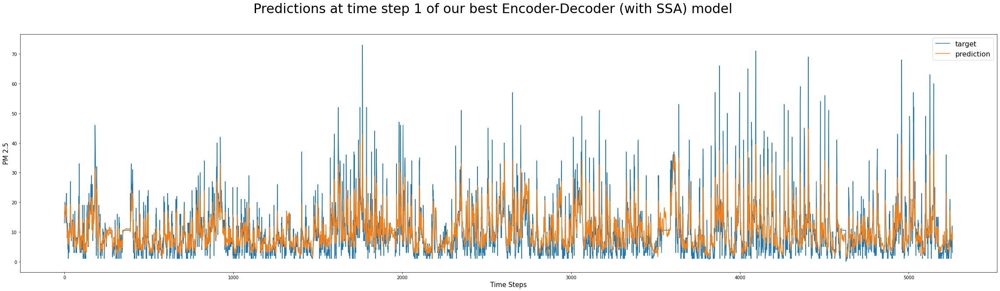

In [ ]:
plot_model_predictions(time_step = 1, input_length = 48, output_length = 6, learning_rate = 0.01, num_layers = 1)

### Predictions 3 hours into the future

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


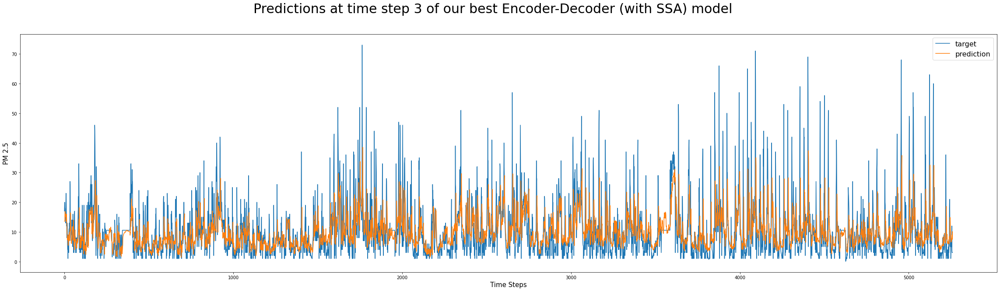

In [ ]:
plot_model_predictions(time_step = 3, input_length = 48, output_length = 6, learning_rate = 0.01, num_layers = 1)

### Predictions 6 hours into the future

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


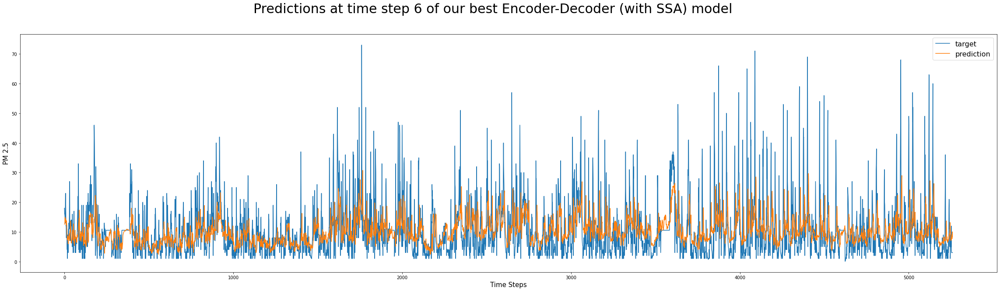

In [ ]:
plot_model_predictions(time_step = 6, input_length = 48, output_length = 6, learning_rate = 0.01, num_layers = 1)

## Our best model with output length = 9
- input_length = 72, learning_rate = 0.091, num_layer = 2

- Metrics: MAE loss :  5.57 MSE loss :  68.90 R2 score:  0.152


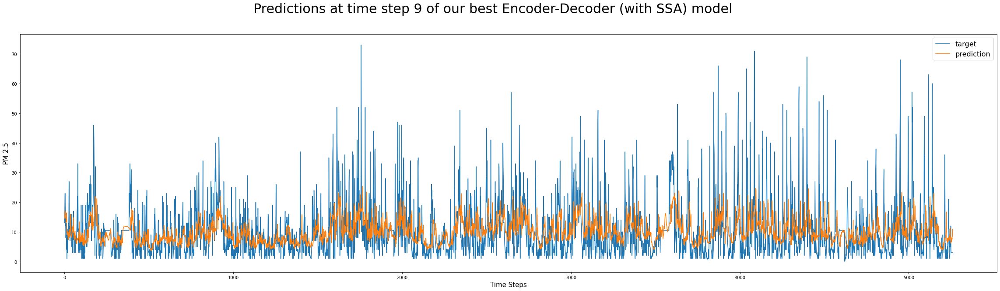

In [ ]:
plot_model_predictions(time_step = 9, input_length = 72, output_length = 9, learning_rate = 0.001, num_layers = 2)

 ## Our best model with output length = 12

- input_length = 24, learning_rate = 0.01, num_layer = 2


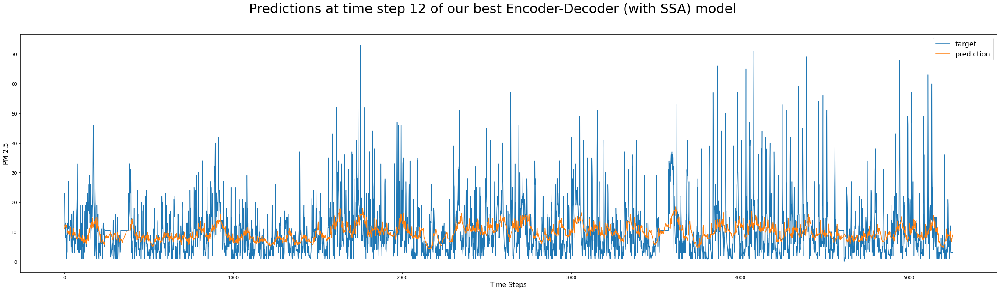

In [ ]:
plot_model_predictions(time_step = 12, output_length = 12, input_length = 24, learning_rate = 0.01, num_layers = 2)